# Skin Disease Images
We found our [dataset](https://www.kaggle.com/datasets/ismailpromus/skin-diseases-image-dataset) from kaggle. This dataset contains 10 different types or labels of skin diseases with roughly 1200+ files of each Skin Disease Type. We want to be able to predict the Skin Disease Label given an image.

In [4]:
# Imports
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline

10 classes:
['Atopic Dermatitis', 'Basal Cell Carcinoma', 'Benign Keratosis-like Lesions', 'Eczema', 'Melanocytic Nevi', 'Melanoma', 'Psoriasis pictures Lichen Planus and related diseases', 'Seborrheic Keratoses and other Benign Tumors', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Warts Molluscum and other Viral Infections']


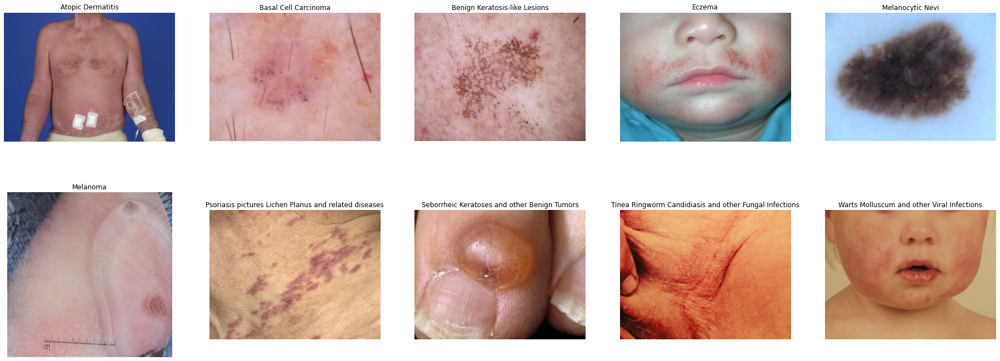

In [23]:
# Read in the data
# Set the path to the Images
data_folder = 'data/archive/IMG_CLASSES'

# Get the class names
classes = os.listdir(data_folder)
classes.sort()
print(len(classes), 'classes:')
print(classes)

# Show the first image in each folder
fig = plt.figure(figsize=(32, 12))
i = 0
for sub_dir in os.listdir(data_folder):
    i+=1
    img_file = os.listdir(os.path.join(data_folder,sub_dir))[0]
    img_path = os.path.join(data_folder, sub_dir, img_file)
    img = mpimg.imread(img_path)
    a=fig.add_subplot(2, int(len(classes)/2),i)
    a.axis('off')
    imgplot = plt.imshow(img)
    a.set_title(sub_dir)
plt.show()

It seems like we have 10 classes for our multi-label classification problem. We have also shown sample images from each of the 10 classes and they seem to be varying images of different skin diseases as desired.

# Checking for Class Imbalance

In [6]:
import fnmatch
# Count
countList = []
for sub_dir in os.listdir(data_folder):
    folder_path = os.path.join(data_folder, sub_dir)
    count = len(fnmatch.filter(os.listdir(folder_path), '*.*'))
    countList.append(count)
print(countList)

[1257, 3323, 2079, 1677, 7970, 3140, 2055, 1847, 1702, 2103]


C:\Users\steve\AppData\Local\Temp\ipykernel_20164\4247260690.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(classes, rotation=90)
C:\Users\steve\AppData\Local\Temp\ipykernel_20164\4247260690.py:12: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


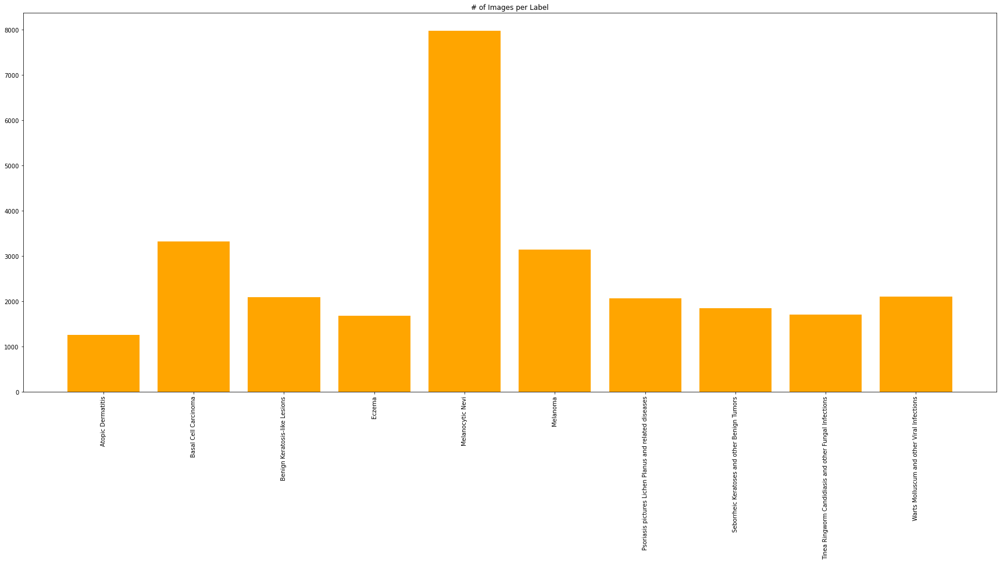

In [7]:
# Plotting Amount of Images per each Label

# Create a figure
fig, ax = plt.subplots(1, 1, figsize = (30,12))

# Create a bar plot of name vs grade on the first axis
ax.bar(x=classes, height=countList, color='orange')
ax.set_title('# of Images per Label')
ax.set_xticklabels(classes, rotation=90)

# Show the figure
fig.show()

Here we can see that out Atopic Dermatitis Label inherentely has less image data files avaliable compared to the other classes. Additionally, we can see that we have a extremely large amount of Melanocytic Nevi Data. We may need to implement data augumentation* or data cleaning techniques later to ensure that we have enough data and there are no class imbalances for each of the classes of skin diseases our model will be predicting.

In [8]:
# Dimension Reduction/Clustering UMAP
# checking "null" images/ removing poison data
# SKlearn model for comparison

# Rendering as many Images as Possible

In [49]:
# Show Images for One Class
fig = plt.figure(figsize=(256,128))
rows = 80
columns = 10
i = 0
for sub_dir in os.listdir(data_folder):
    for j in range(1, int(rows*columns/10) + 1):
            i = i + 1
            img_file = os.listdir(os.path.join(data_folder,sub_dir))[j]
            img_path = os.path.join(data_folder, sub_dir, img_file)
            img = mpimg.imread(img_path)
            a=fig.add_subplot(rows, columns, i)
            a.axis('off')
            imgplot = plt.imshow(img)
            a.set_title(sub_dir)
plt.show()



Here we plot ~800 sample images from our dataset to get a "general feel" of the dataset and all the images for each class. We can observe that each classfication label's images has some differences when perceived by a human. The next step would be to training our models and experimenting with Machine Learning's ability to predict and understand the underlying patterns present in our dataset.